In [1]:
import pandas as pd
import matplotlib as plt
from sklearn import datasets  
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import  DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn import preprocessing
import string

# The economic meltdown of 2008, initiated a conversation about market sustainability, and the tools that can be used to predict it. The need for better predictive models become apparent, in order to avoid such devastating events in the future. Bankruptcy of companies and enterprises effects the financial market at multiple fronts, and hence the need to predict bankruptcy among companies by monitoring multiple variables takes on an added significance. A better understanding of bankruptcy and the ability to predict it will impact affect the profitability of lending institutions worldwide
With that in mind, we undertook the task of building different supervised-machine learning algorithms, along with a comparative analysis of each model, in order to identify those that are better suited for predicting economic bankruptcy.


In [2]:
df=pd.read_csv("C:\\Users\\kalpana\\Documents\\bankruptcy-prevention2.csv")

In [3]:
df

,industrial_risk,management_risk,financial_flexibility,credibility,competitiveness,operating_risk,class
0,0.5,1.0,0.0,0.0,0.0,0.5,bankruptcy
1,0.0,1.0,0.0,0.0,0.0,1.0,bankruptcy
2,1.0,0.0,0.0,0.0,0.0,1.0,bankruptcy
3,0.5,0.0,0.0,0.5,0.0,1.0,bankruptcy
4,1.0,1.0,0.0,0.0,0.0,1.0,bankruptcy
...,...,...,...,...,...,...,...
245,0.0,1.0,1.0,1.0,1.0,1.0,non-bankruptcy
246,1.0,1.0,0.5,1.0,1.0,0.0,non-bankruptcy
247,0.0,1.0,1.0,0.5,0.5,0.0,non-bankruptcy
248,1.0,0.0,0.5,1.0,0.5,0.0,non-bankruptcy


In [4]:
df.columns

Index(['industrial_risk', ' management_risk', ' financial_flexibility',
       ' credibility', ' competitiveness', ' operating_risk', ' class'],
      dtype='object')

In [5]:
df.rename(columns={'industrial_risk':'Industrial_risk',' management_risk':'Managment_risk',' financial_flexibility':'financial_flexibility',' credibility':'credibility',' competitiveness':'competitiveness',' operating_risk':'operating_risk',' class':'class'},inplace=True)


In [6]:
df.head()

,Industrial_risk,Managment_risk,financial_flexibility,credibility,competitiveness,operating_risk,class
0,0.5,1.0,0.0,0.0,0.0,0.5,bankruptcy
1,0.0,1.0,0.0,0.0,0.0,1.0,bankruptcy
2,1.0,0.0,0.0,0.0,0.0,1.0,bankruptcy
3,0.5,0.0,0.0,0.5,0.0,1.0,bankruptcy
4,1.0,1.0,0.0,0.0,0.0,1.0,bankruptcy


In [7]:
df.describe()

,Industrial_risk,Managment_risk,financial_flexibility,credibility,competitiveness,operating_risk
count,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000
mean,0.518000,0.614000,0.376000,0.470000,0.476000,0.570000
std,0.411526,0.410705,0.401583,0.415682,0.440682,0.434575
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
75%,1.000000,1.000000,0.500000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Industrial_risk        250 non-null    float64
 1   Managment_risk         250 non-null    float64
 2   financial_flexibility  250 non-null    float64
 3   credibility            250 non-null    float64
 4   competitiveness        250 non-null    float64
 5   operating_risk         250 non-null    float64
 6   class                  250 non-null    object 
dtypes: float64(6), object(1)
memory usage: 13.8+ KB


In [9]:
df["class"].value_counts()

non-bankruptcy    143
bankruptcy        107
Name: class, dtype: int64

Imported v0.1.55. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
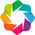

In [10]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Shape of your Data Set loaded: (250, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
industrial_risk,3,float64,0,0.000000,1.200000,0,
management_risk,3,float64,0,0.000000,1.200000,0,
financial_flexibility,3,float64,0,0.000000,1.200000,0,
credibility,3,float64,0,0.000000,1.200000,0,
competitiveness,3,float64,0,0.000000,1.200000,0,
operating_risk,3,float64,0,0.000000,1.200000,0,
class,2,object,0,0.000000,0.800000,107,


    7 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 21


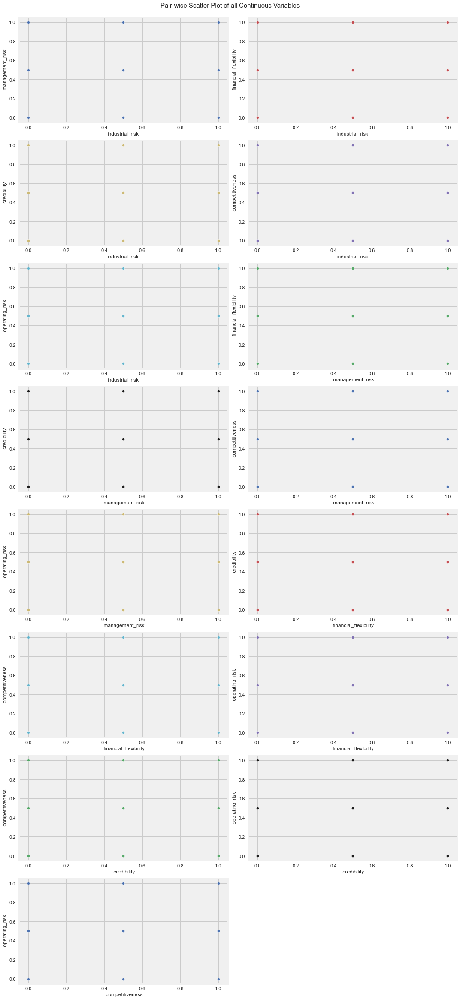

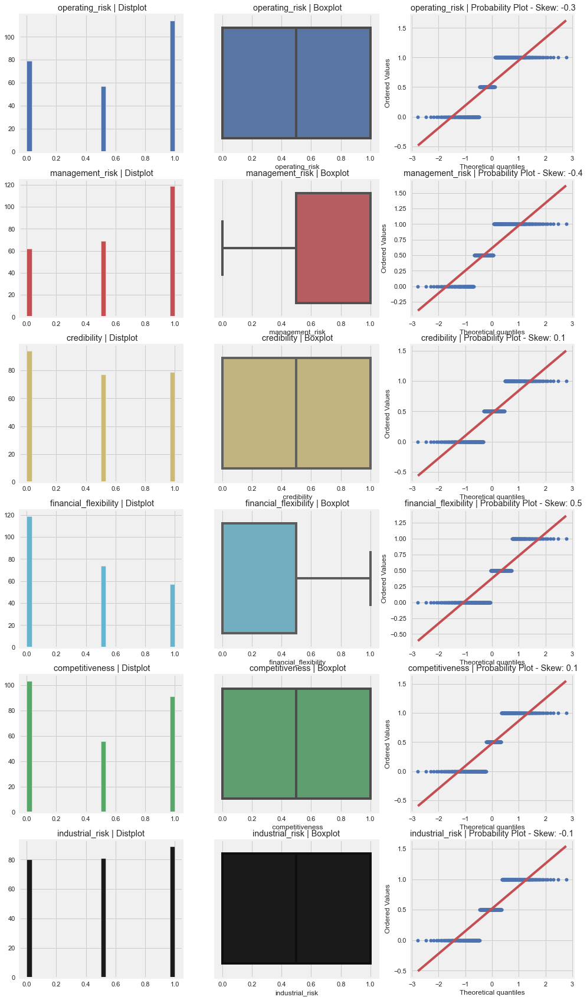

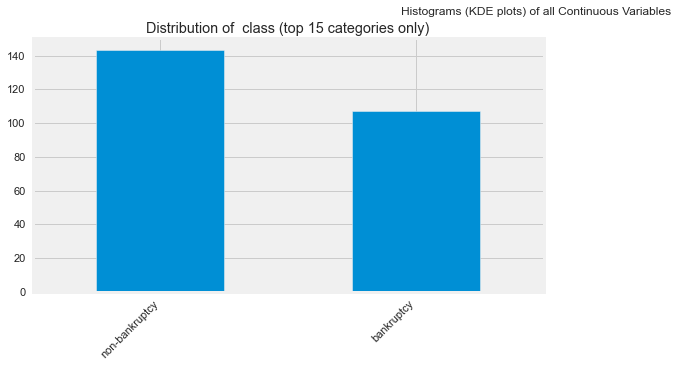

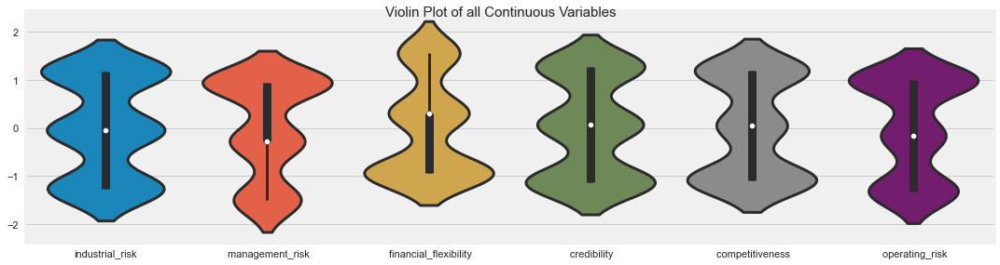

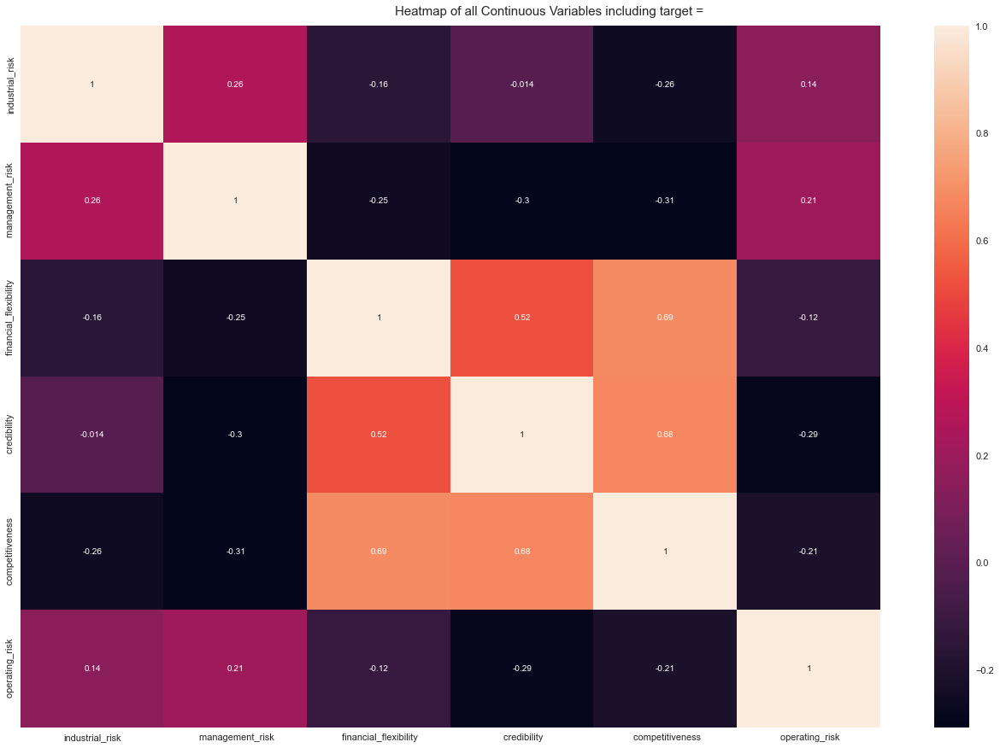

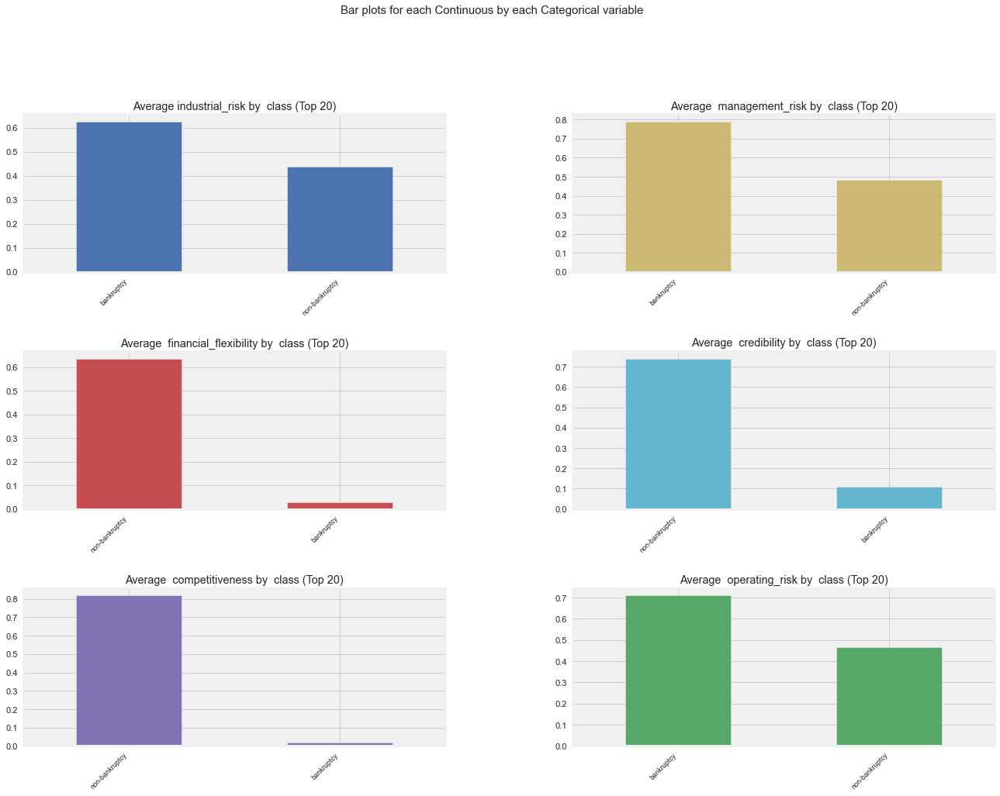

All Plots done
Time to run AutoViz = 17 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [11]:
import matplotlib.pyplot as plt
%matplotlib inline
filename = "C:\\Users\\kalpana\\Documents\\bankruptcy-prevention2.csv"
dft=AV.AutoViz(
filename
)

In [12]:
from sklearn.preprocessing import LabelEncoder

In [13]:
df.head()

,Industrial_risk,Managment_risk,financial_flexibility,credibility,competitiveness,operating_risk,class
0,0.5,1.0,0.0,0.0,0.0,0.5,bankruptcy
1,0.0,1.0,0.0,0.0,0.0,1.0,bankruptcy
2,1.0,0.0,0.0,0.0,0.0,1.0,bankruptcy
3,0.5,0.0,0.0,0.5,0.0,1.0,bankruptcy
4,1.0,1.0,0.0,0.0,0.0,1.0,bankruptcy


In [14]:
df["class"].value_counts()

non-bankruptcy    143
bankruptcy        107
Name: class, dtype: int64

In [15]:
import numpy as np
import pandas as pd
from plotnine import *


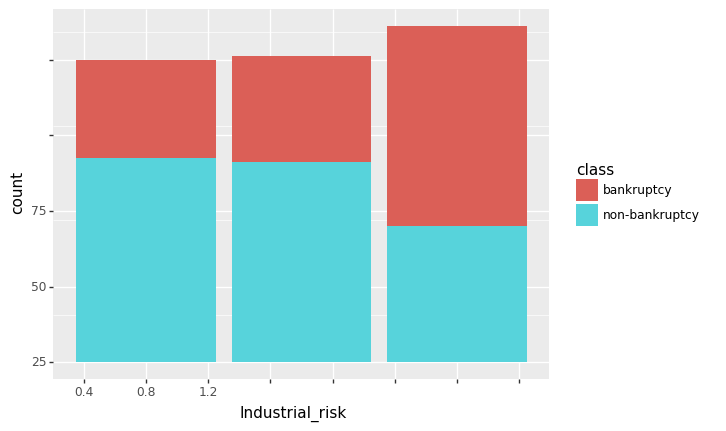

<ggplot: (136866115804)>

In [16]:
ggplot(df, aes(x='Industrial_risk', fill = 'class')) + \
    geom_bar(stat = 'count')

In [17]:
#industrial_risk is high then bankruptcy is increase

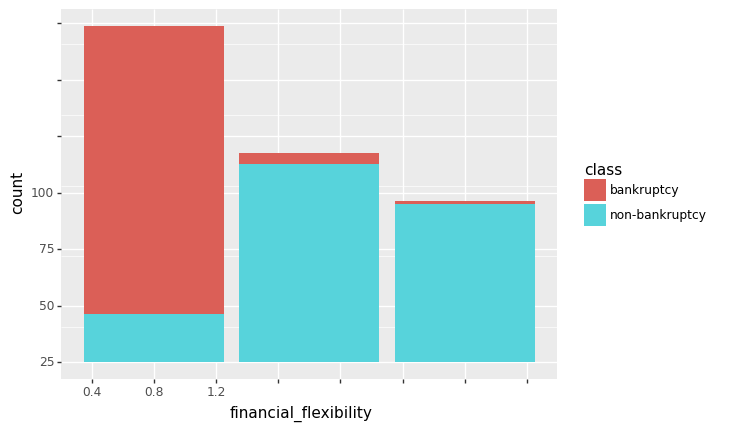

<ggplot: (136866166574)>

In [18]:
ggplot(df, aes(x='financial_flexibility', fill = 'class')) + \
    geom_bar(stat = 'count')

In [19]:
#finacial risk is low then bankruptcy is increase

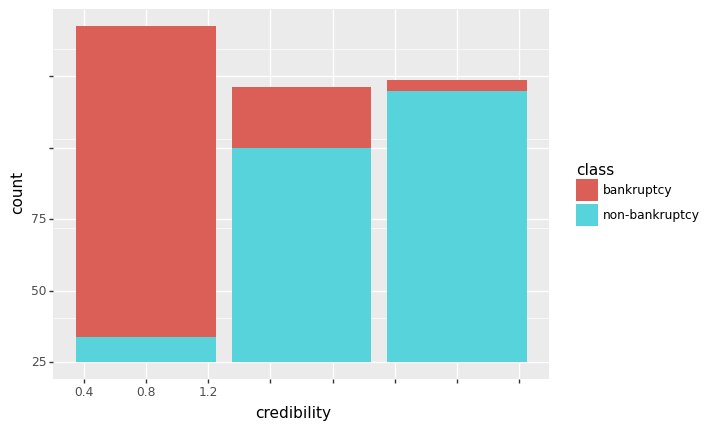

<ggplot: (136866404615)>

In [20]:
ggplot(df, aes(x='credibility', fill = 'class')) + \
    geom_bar(stat = 'count')

In [21]:
#credibility is low then bankruptcy is increase

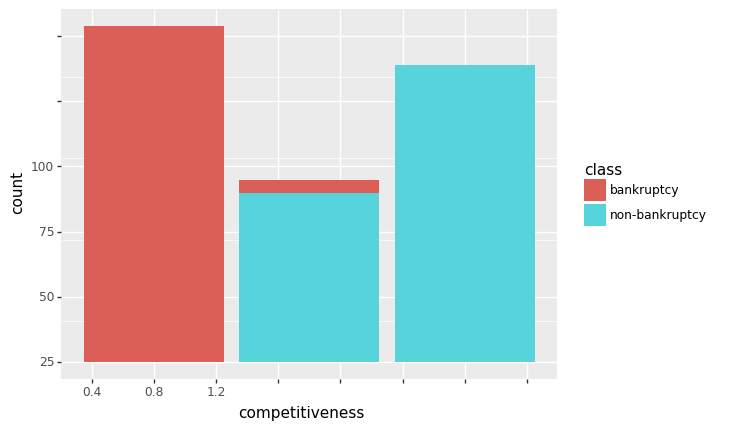

<ggplot: (136866170868)>

In [22]:
ggplot(df, aes(x='competitiveness', fill = 'class')) + \
    geom_bar(stat = 'count')

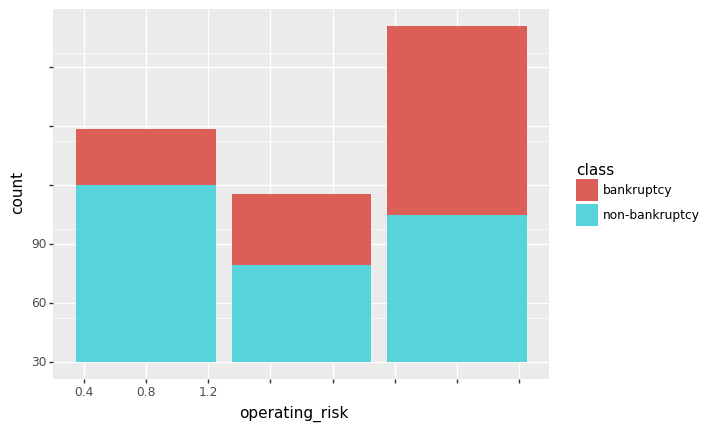

<ggplot: (136870365654)>

In [23]:
ggplot(df, aes(x='operating_risk', fill = 'class')) + \
    geom_bar(stat = 'count')

In [24]:
le = preprocessing.LabelEncoder()
df['class']=le.fit_transform(df['class'])

In [25]:
df.corr()

,Industrial_risk,Managment_risk,financial_flexibility,credibility,competitiveness,operating_risk,class
Industrial_risk,1.000000,0.255127,-0.162624,-0.014438,-0.257814,0.144507,-0.227823
Managment_risk,0.255127,1.000000,-0.254845,-0.303341,-0.306568,0.213874,-0.370838
financial_flexibility,-0.162624,-0.254845,1.000000,0.524951,0.686612,-0.116903,0.751020
credibility,-0.014438,-0.303341,0.524951,1.000000,0.675689,-0.288458,0.755909
competitiveness,-0.257814,-0.306568,0.686612,0.675689,1.000000,-0.211383,0.899452
operating_risk,0.144507,0.213874,-0.116903,-0.288458,-0.211383,1.000000,-0.279786
class,-0.227823,-0.370838,0.751020,0.755909,0.899452,-0.279786,1.000000


In [26]:
import seaborn as sns

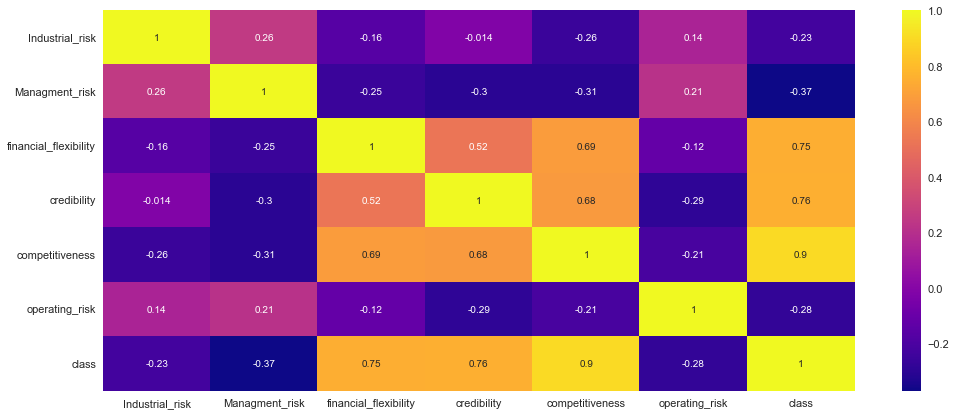

In [27]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True,cmap='plasma')

(-1.1126407887254428,
 1.1006019659864976,
 -1.1133156631889543,
 1.1175516748878593)

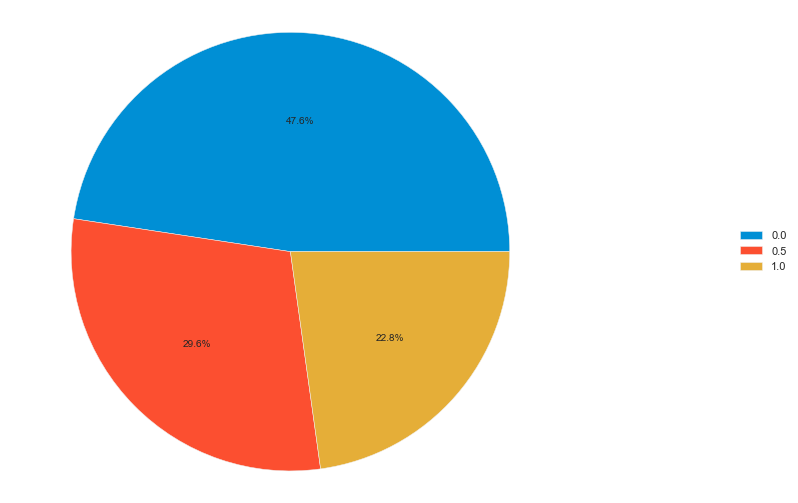

In [28]:
#Basic pie chart to view distribution of apps across various categories
fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(aspect="equal"))
number_of_apps = df["financial_flexibility"].value_counts()
labels = number_of_apps.index
sizes = number_of_apps.values
ax.pie(sizes,labeldistance=2,autopct='%1.1f%%')
ax.legend(labels=labels,loc="right",bbox_to_anchor=(0.9, 0, 0.5, 1))
ax.axis("equal")

(-1.1131515523585773,
 1.1006262643980276,
 -1.1137643022335206,
 1.1210379582543215)

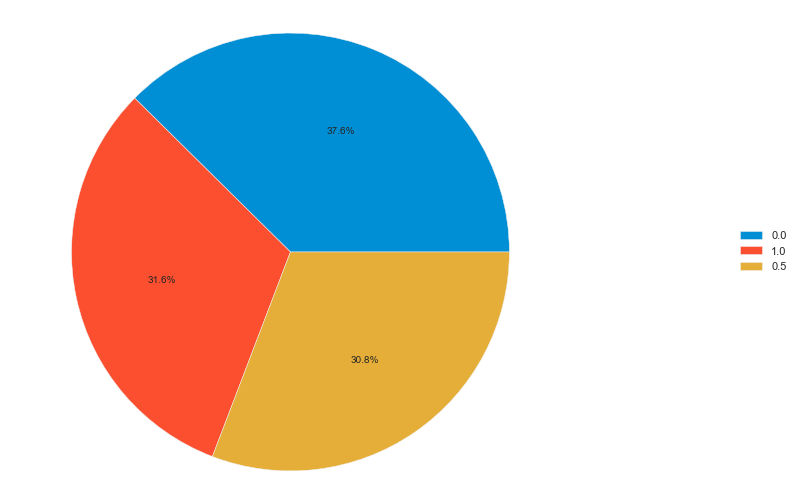

In [29]:
#Basic pie chart to view distribution of apps across various categories
fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(aspect="equal"))
number_of_apps = df["credibility"].value_counts()
labels = number_of_apps.index
sizes = number_of_apps.values
ax.pie(sizes,labeldistance=2,autopct='%1.1f%%')
ax.legend(labels=labels,loc="right",bbox_to_anchor=(0.9, 0, 0.5, 1))
ax.axis("equal")

(-1.1036109064739164,
 1.1001719479273293,
 -1.1198580407475374,
 1.1233839615015477)

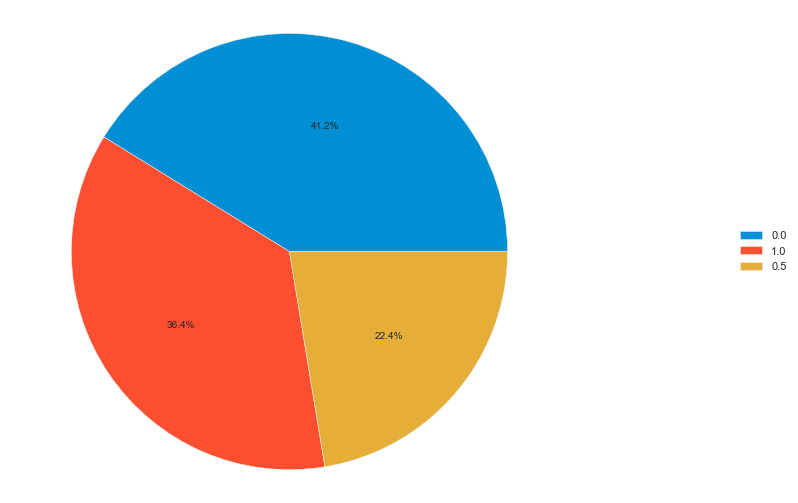

In [30]:
#Basic pie chart to view distribution of apps across various categories
fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(aspect="equal"))
number_of_apps = df["competitiveness"].value_counts()
labels = number_of_apps.index
sizes = number_of_apps.values
ax.pie(sizes,labeldistance=2,autopct='%1.1f%%')
ax.legend(labels=labels,loc="right",bbox_to_anchor=(0.9, 0, 0.5, 1))
ax.axis("equal")

# Declaring features & target

In [31]:

X = df.drop(['class'], axis=1)
y = df['class']

# Train-Test split the data

In [32]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 2)

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.3)
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_train, y_train = sm.fit_resample(X_train, y_train)
  

In [34]:
print('After OverSampling, the shape of train_X: {}'.format(X_train.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(X_train.shape))
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train== 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0)))

After OverSampling, the shape of train_X: (186, 6)
After OverSampling, the shape of train_y: (186, 6) 

After OverSampling, counts of label '1': 93
After OverSampling, counts of label '0': 93


In [35]:
from mlxtend.evaluate import bias_variance_decomp

# LDA for Binary Classification Python

In [36]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.datasets import make_classification
from sklearn.metrics import ConfusionMatrixDisplay,precision_score,recall_score,confusion_matrix
import warnings

# Fitting LDA with data

In [37]:
LDA = LinearDiscriminantAnalysis()
LDA.fit(X_train, y_train)
LDA_pred=LDA.predict(X_test)

True Positive 49
True Negative 25
False Positive 0
False Negative 1


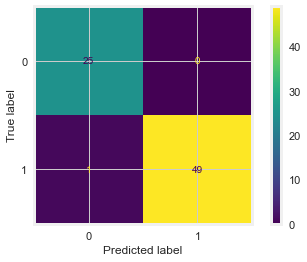

In [38]:
tn, fp, fn, tp = confusion_matrix(list(y_test), list(LDA_pred), labels=[0, 1]).ravel()
print('True Positive', tp)
print('True Negative', tn)
print('False Positive', fp)
print('False Negative', fn)
 
ConfusionMatrixDisplay.from_predictions(y_test, LDA_pred)
plt.show()

# Random Forest Classifier

In [39]:
from sklearn.ensemble import RandomForestClassifier

In [40]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)  
  

In [41]:
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [42]:
# performing predictions on the test dataset
y_pred1 = clf.predict(X_test)
y_pred2=clf.predict(X_train)  
# metrics are used to find accuracy or error
from sklearn import metrics  
print()
  
# using metrics module for accuracy calculation
print("ACCURACY OF THE MODEL test: ", metrics.accuracy_score(y_test, y_pred1))
print("ACCURACY OF THE MODEL train: ", metrics.accuracy_score(y_train, y_pred2))



ACCURACY OF THE MODEL test:  1.0
ACCURACY OF THE MODEL train:  1.0


In [43]:
# Confusion Matrix for the model accuracy
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test,y_pred1)
print (confusion_matrix)

[[25  0]
 [ 0 50]]


In [44]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        25
           1       1.00      1.00      1.00        50

    accuracy                           1.00        75
   macro avg       1.00      1.00      1.00        75
weighted avg       1.00      1.00      1.00        75



In [45]:
y_pred2

array([0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

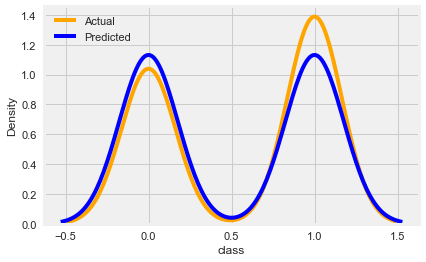

In [46]:
sns.distplot(y,hist=False,color='orange',label='Actual')
sns.distplot(y_pred2,hist=False,color='blue',label='Predicted')
plt.legend()
plt.show()

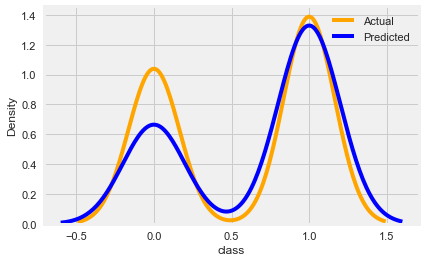

In [47]:
sns.distplot(y,hist=False,color='orange',label='Actual')
sns.distplot(y_pred1,hist=False,color='blue',label='Predicted')
plt.legend()
plt.show()

In [48]:
from sklearn.metrics import zero_one_loss
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    random_state=123,
                                                    shuffle=True,
                                                    stratify=y)


In [49]:
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp( clf, X_train.values, y_train.values, X_test.values, y_test.values, loss='0-1_loss', random_seed=123)


In [50]:
print('Avg Bias: %.3f' % avg_bias)
print('Avg Variance: %.3f' % avg_var)

Avg Bias: 0.000
Avg Variance: 0.011


Text(0, 0.5, 'True Positive Rate')

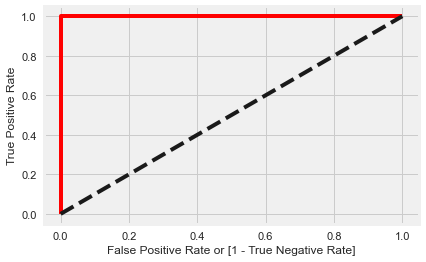

In [51]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

fpr, tpr, thresholds = roc_curve(y, clf.predict_proba (X)[:,1])

auc = roc_auc_score(y_test, y_pred1)

import matplotlib.pyplot as plt
plt.plot(fpr, tpr, color='red', label='logit model ( area  = %0.2f)'%auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')

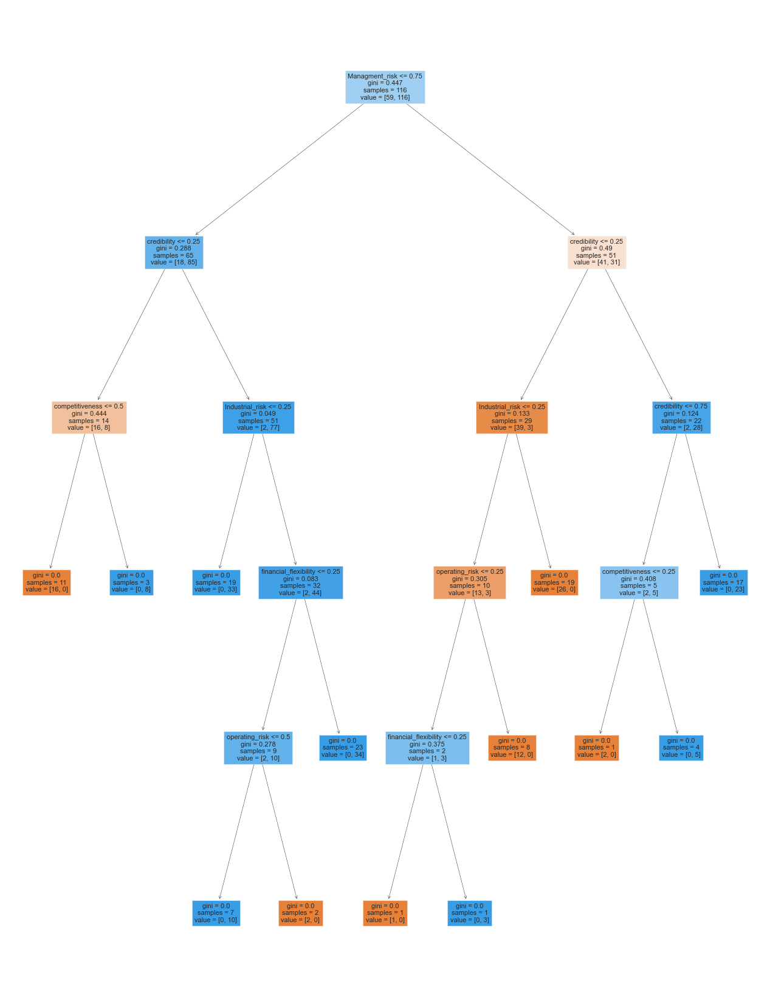

In [52]:
plt.figure(figsize=(20,30))
_ = tree.plot_tree(clf.estimators_[0], feature_names=X.columns, filled=True)

Gini impurity is a function that determines how well a decision tree was split. Basically, it helps us to determine which splitter is best so that we can build a pure decision tree. Gini impurity ranges values from 0 to 0.5

In [53]:
from sklearn import tree

# Bagged Decision Trees for Classification¶

In [54]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingClassifier

In [55]:
kfold = KFold(n_splits=10, random_state=7,shuffle=True)
cart = DecisionTreeClassifier()
num_trees = 100
model = BaggingClassifier(base_estimator=cart, n_estimators=num_trees, random_state=1)
results = cross_val_score(model, X, y, cv=kfold)
print(results.mean())

0.992


In [56]:
model.fit(X_train, y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100,
                  random_state=1)

In [57]:
pred1 = model.predict(X_test)

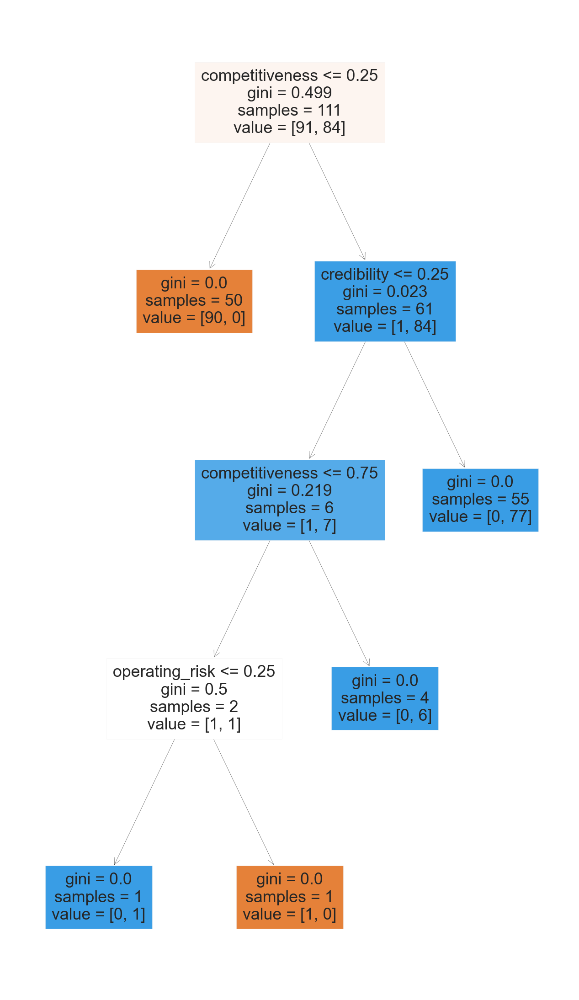

In [58]:
plt.figure(figsize=(20,40))
_ = tree.plot_tree(model.estimators_[0], feature_names=X.columns, filled=True)

In [59]:
from sklearn.ensemble import AdaBoostClassifier

In [60]:
kfold = KFold(n_splits=10, random_state=7,shuffle=True)
model1 = AdaBoostClassifier(base_estimator=cart, n_estimators=num_trees, random_state=1)
results = cross_val_score(model1, X, y, cv=kfold)
print(results.mean())

0.992


In [61]:
model1.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100,
                   random_state=1)

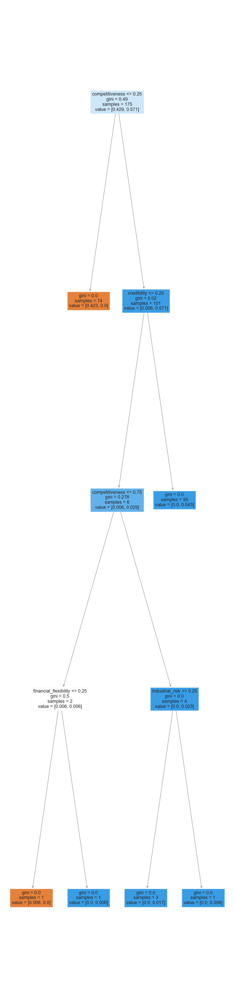

In [62]:
plt.figure(figsize=(10,50))
_ = tree.plot_tree(model1.estimators_[0], feature_names=X.columns, filled=True)

In [63]:
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp( model1, X_train.values, y_train.values, X_test.values, y_test.values, loss='0-1_loss', random_seed=123)


In [64]:
print('Avg Bias: %.3f' % avg_bias)
print('Avg Variance: %.3f' % avg_var)

Avg Bias: 0.000
Avg Variance: 0.017


# SVC MODEL

In [65]:
from sklearn.svm import SVC

In [66]:
# Training a SVM classifier using SVC class
svm = SVC(kernel= 'rbf', random_state=1, C=0.1)
svm.fit(X_train, y_train)
 
# Mode performance
from sklearn.metrics import accuracy_score
 
y_pred = svm.predict(X_test)
print('Accuracy: %.3f' % accuracy_score(y_test, y_pred))

Accuracy: 1.000


In [67]:
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp( svm, X_train.values, y_train.values, X_test.values, y_test.values, loss='0-1_loss', random_seed=123)
print('Avg Bias: %.3f' % avg_bias)
print('Avg Variance: %.3f' % avg_var)


Avg Bias: 0.000
Avg Variance: 0.004


# Logistic Regression

In [68]:
from sklearn.linear_model import LogisticRegression
classifier=LogisticRegression()

In [69]:
classifier.fit(X_train,y_train)

LogisticRegression()

In [70]:
y_pred = classifier.predict(X)

In [71]:
from sklearn.metrics import classification_report
print(classification_report(y,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       107
           1       0.99      1.00      1.00       143

    accuracy                           1.00       250
   macro avg       1.00      1.00      1.00       250
weighted avg       1.00      1.00      1.00       250



# .naive bayes model

In [72]:
# train a Gaussian Naive Bayes classifier on the training set
from sklearn.naive_bayes import GaussianNB


# instantiate the model
gnb = GaussianNB()


# fit the model
gnb.fit(X_train, y_train)

GaussianNB()

In [73]:
y_pred3 = gnb.predict(X_test)

y_pred3

array([1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1])

In [74]:
from sklearn.metrics import accuracy_score

print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred3)))

Model accuracy score: 0.9600


In [75]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred3))

              precision    recall  f1-score   support

           0       1.00      0.91      0.95        32
           1       0.93      1.00      0.97        43

    accuracy                           0.96        75
   macro avg       0.97      0.95      0.96        75
weighted avg       0.96      0.96      0.96        75



# k-Fold Cross Validation¶

In [76]:
# Applying 10-Fold Cross Validation

from sklearn.model_selection import cross_val_score

scores = cross_val_score(gnb, X_train, y_train, cv = 5, scoring='accuracy')

print('Cross-validation scores:{}'.format(scores))

Cross-validation scores:[1.         0.94285714 0.97142857 0.97142857 1.        ]


In [77]:
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp( gnb, X_train.values, y_train.values, X_test.values, y_test.values, loss='0-1_loss', random_seed=123)


In [78]:
print('Avg Bias: %.3f' % avg_bias)
print('Avg Variance: %.3f' % avg_var)

Avg Bias: 0.040
Avg Variance: 0.009


# KNN Classifier

In [79]:
#Fitting K-NN classifier to the training set  
from sklearn.neighbors import KNeighborsClassifier  
classifier= KNeighborsClassifier(n_neighbors=25, metric='minkowski')  
classifier.fit(X_train, y_train)  

KNeighborsClassifier(n_neighbors=25)

In [80]:
#Predicting the test set result  
y_pred4= classifier.predict(X)  

In [81]:
y_pred4

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1])

In [82]:
# Confusion Matrix for the model accuracy
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y,y_pred4)
print (confusion_matrix)

[[106   1]
 [  0 143]]


Text(0, 0.5, 'True Positive Rate')

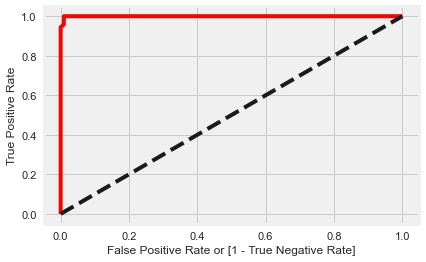

In [83]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

fpr, tpr, thresholds = roc_curve(y, classifier.predict_proba (X)[:,1])

auc = roc_auc_score(y, y_pred4)

import matplotlib.pyplot as plt
plt.plot(fpr, tpr, color='red', label='logit model ( area  = %0.2f)'%auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')

In [84]:
y_pred_df4= pd.DataFrame({'actual': y,
                         'predicted_prob': classifier.predict(X)})

In [85]:
y_pred_df4

,actual,predicted_prob
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
245,1,1
246,1,1
247,1,1
248,1,1


In [86]:
y_pred_df4["actual"].value_counts()

1    143
0    107
Name: actual, dtype: int64

In [87]:
y_pred_df4["predicted_prob"].value_counts()

1    144
0    106
Name: predicted_prob, dtype: int64

In [88]:
predicted = []
testtrain = np.array(X_train)
for i in range(len(testtrain)):
    predicted.append(svm.predict([testtrain[i]]))
    

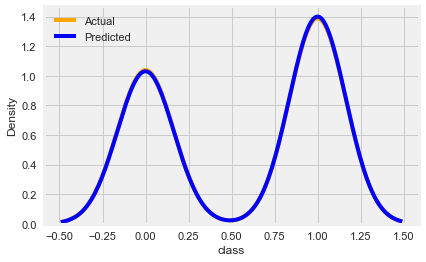

In [89]:
sns.distplot(y,hist=False,color='orange',label='Actual')
sns.distplot(y_pred4,hist=False,color='blue',label='Predicted')
plt.legend()
plt.show()

In [90]:
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp( classifier, X_train.values, y_train.values, X_test.values, y_test.values, loss='0-1_loss', random_seed=123)


In [91]:
print('Avg Bias: %.3f' % avg_bias)
print('Avg Variance: %.3f' % avg_var)

Avg Bias: 0.000
Avg Variance: 0.012


# lazypredict

In [92]:
import lazypredict
from lazypredict.Supervised import LazyClassifier #CLassification
from sklearn.model_selection import train_test_split # data split

In [93]:
import pandas as pd
from sklearn.model_selection import train_test_split
# Call train test split on the data and capture the results
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)


In [94]:
# LazyClassifier Instance and fiting data
cls= LazyClassifier(ignore_warnings=False, custom_metric=None)
models, predictions = cls.fit(X_train, X_test, y_train, y_test)
print(models)

 14%|███████████▍                                                                       | 4/29 [00:00<00:01, 12.98it/s]

CategoricalNB model failed to execute
Negative values in data passed to CategoricalNB (input X)


 97%|███████████████████████████████████████████████████████████████████████████████▏  | 28/29 [00:01<00:00, 18.66it/s]

StackingClassifier model failed to execute
__init__() missing 1 required positional argument: 'estimators'


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 17.89it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
GaussianNB                         1.00               1.00     1.00      1.00   
ExtraTreesClassifier               1.00               1.00     1.00      1.00   
LogisticRegression                 1.00               1.00     1.00      1.00   
QuadraticDiscriminantAnalysis      1.00               1.00     1.00      1.00   
RandomForestClassifier             1.00               1.00     1.00      1.00   
LabelSpreading                     1.00               1.00     1.00      1.00   
LabelPropagation                   1.00               1.00     1.00      1.00   
NuSVC                              1.00               1.00     1.00      1.00   
SVC                                1.00               1.00     1.00      1.00   
BernoulliNB                        1.00               1.00     1.00      1.00   
PassiveAggressiveClassifier 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26]),
 <a list of 27 Text major ticklabel objects>)

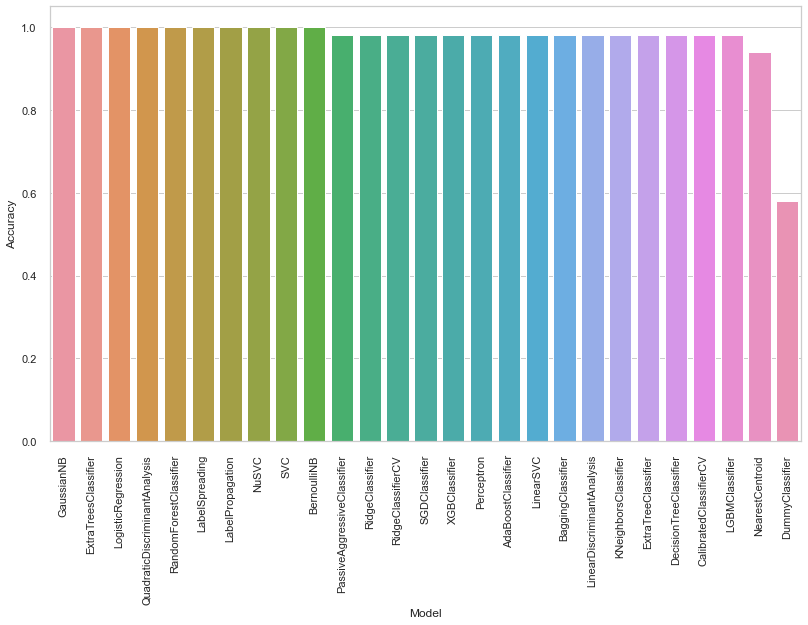

In [95]:
#plotting the accuracy scores
 
import matplotlib.pyplot as plt
import seaborn as sns
 
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=models.index, y="Accuracy", data=models)
plt.xticks(rotation=90)

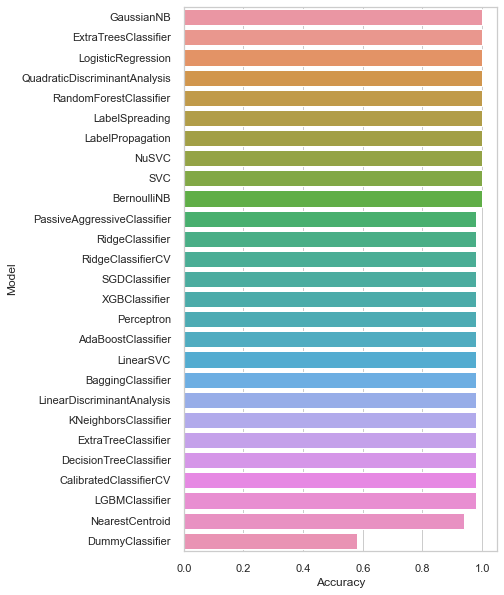

In [96]:
plt.figure(figsize=(5, 10))
sns.set_theme(style="whitegrid")
ax = sns.barplot(y=models.index, x="Accuracy", data=models)

In [97]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(max_iter=1000, tol=1e-3, random_state=42)
sgd_clf.fit(X_train, y_train)

SGDClassifier(random_state=42)

In [98]:
sgd_clf.predict(X_test)

array([1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 0])

In [99]:
scores = cross_val_score(sgd_clf, X_train, y_train, cv = 5, scoring='accuracy')
print('Cross-validation scores:{}'.format(scores))

Cross-validation scores:[1.    1.    1.    0.975 1.   ]


In [100]:
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp( sgd_clf, X_train.values, y_train.values, X_test.values, y_test.values, loss='0-1_loss', random_seed=123)


In [101]:
print('Avg Bias: %.3f' % avg_bias)
print('Avg Variance: %.3f' % avg_var)

Avg Bias: 0.020
Avg Variance: 0.022


In [102]:
# performing predictions on the test dataset
y_pred6 =sgd_clf.predict(X_train)
y_pred7=sgd_clf.predict(X_test)  
# metrics are used to find accuracy or error
from sklearn import metrics  
print()
  
# using metrics module for accuracy calculation
print("ACCURACY OF THE MODEL test: ", metrics.accuracy_score(y_train, y_pred6))
print("ACCURACY OF THE MODEL train: ", metrics.accuracy_score(y_test, y_pred7))



ACCURACY OF THE MODEL test:  1.0
ACCURACY OF THE MODEL train:  0.94


In [103]:
# Confusion Matrix for the model accuracy
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test,y_pred7)
print (confusion_matrix)

[[21  0]
 [ 3 26]]


In [104]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred7))

              precision    recall  f1-score   support

           0       0.88      1.00      0.93        21
           1       1.00      0.90      0.95        29

    accuracy                           0.94        50
   macro avg       0.94      0.95      0.94        50
weighted avg       0.95      0.94      0.94        50



In [105]:
y_pred6=sgd_clf.predict(X)

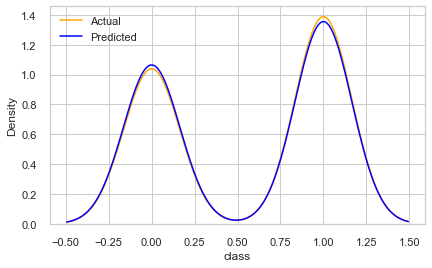

In [106]:
sns.distplot(y,hist=False,color='orange',label='Actual')
sns.distplot(y_pred6,hist=False,color='blue',label='Predicted')
plt.legend()
plt.show()

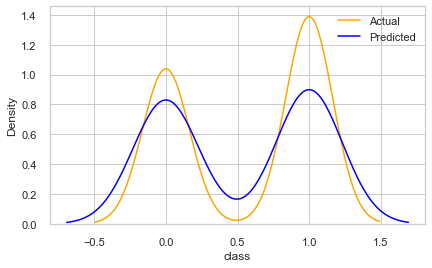

In [107]:
sns.distplot(y,hist=False,color='orange',label='Actual')
sns.distplot(y_pred7,hist=False,color='blue',label='Predicted')
plt.legend()
plt.show()

In [108]:
sgd_clf.fit(X_train, y_train)

SGDClassifier(random_state=42)

In [109]:
import pickle

In [113]:
import pickle
pickle.dump(sgd_clf,open('Bank1.pkl','wb'))

In [114]:
pickled_model=pickle.load(open('Bank1.pkl','rb'))

In [115]:
pickled_model.score(X_test,y_test)

1.0